<a href="https://www.kaggle.com/code/gpreda/birdclef-2023-metadata-and-sound-data-exploration?scriptVersionId=126493867" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction

This is an introductory Notebook for **[BirdCLEF 2023](https://www.kaggle.com/competitions/birdclef-2023)** new competition.   

### Past BirdCLEF competitions

Kaggle conducted similar competitions in past years, and those attracted a large interest from the community. Here are the links for the last two years competitions: 

- [BirdCLEF 2021](https://www.kaggle.com/c/birdclef-2021)
- [BirdCLEF 2022](https://www.kaggle.com/c/birdclef-2022)


<img src="https://www.imageclef.org/system/files/bird_soundsc.jpg" width=400></img>

### Utility scripts

For clarity, functions are extracted as part of 3 utility scripts (Python modules):
* https://www.kaggle.com/code/gpreda/data-quality-stats/settings - for missing, unique, most frequent values  
* https://www.kaggle.com/code/gpreda/plot-utils - for custom count plot, wordcloud  
* https://www.kaggle.com/code/gpreda/data-quality-stats/ - for sounds play, soundwave and spectrogram  

### Content  

The Notebook is structured as following:
- <a href='#1'>Prepare analysis</a>  
  - <a href='#11'>Packages</a>  
  - <a href='#12'>Read metadata (csv) files</a>  
  - <a href='#13'>Quicly glimpse the metadata files</a>   
  - <a href='#14'>The sounds data</a>   
- <a href='#2'>Deep dive into the metadata</a>
  - <a href='#21'>Utility functions</a>  
  - <a href='#22'>Few stats</a>  
  - <a href='#23'>Univariate analysis</a>  
  - <a href='#24'>Names, species words distribution</a>   
- <a href='#3'>Sample sounds analysis</a>  
  - <a href='#31'>Sound utility functions</a>  
  - <a href='#32'>Test the sound utility functions</a>   
  - <a href='#33'>Check few sounds</a>  
  


# <a id='1'>Prepare analysis</a>

Here we prepare the packages used for the analysis (more in the added utility functions section) and we read the metadata files (csv files).

## <a id='11'>Packages</a>

In [1]:
import os
import sys
import numpy as np
import pandas as pd

## <a id='12'>Read metadata (csv) files</a>

In [2]:
ebird_taxonomy_df = pd.read_csv("/kaggle/input/birdclef-2023/eBird_Taxonomy_v2021.csv")
train_metadata_df = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv")
sample_submission_df = pd.read_csv("/kaggle/input/birdclef-2023/sample_submission.csv")

## <a id='13'>Quickly glimpse the text files</a>

In [3]:
ebird_taxonomy_df.head(2)

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN


In [4]:
train_metadata_df.head(2)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg


In [5]:
sample_submission_df.head(2)

,row_id,abethr1,abhori1,abythr1,afbfly1,afdfly1,afecuc1,affeag1,afgfly1,afghor1,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,soundscape_29201_5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,soundscape_29201_10,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## <a id='14'>The sounds data</a>

In [6]:
print(f"Test set: {len(os.listdir('/kaggle/input/birdclef-2023/test_soundscapes'))} folder/file")
print(f"Train set: {len(os.listdir('/kaggle/input/birdclef-2023/train_audio'))} folders")
folder_dim = [len(files) for r, d, files in os.walk('/kaggle/input/birdclef-2023/train_audio')]
files_total = sum(folder_dim)
print(f"Train set: {files_total} files")

Test set: 1 folder/file
Train set: 264 folders
Train set: 16941 files


# <a id='2'>Deep dive into the metadata</a>

## <a id='21'>Utility functions</a>

Here we include utility scripts for:
* data quality stats  
* plots utilities

The utility scripts for data quality statistics are:
- missing_data  
- unique_values  
- most_frequent_values  

The utility scripts for plots are:  
- genSankey  
- show_wordcloud  
- plot_count  


In [7]:
from data_quality_stats import missing_data, unique_values, most_frequent_values
from plot_utils import genSankey, show_wordcloud, plot_count

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## <a id='22'>Few stats</a>

In [8]:
missing_data(ebird_taxonomy_df)

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
Total,0,0,0,0,0,2,13,16537,12877
Percent,0.0,0.0,0.0,0.0,0.0,0.011938,0.077598,98.710679,76.863845
Types,int64,object,object,object,object,object,object,object,object


In [9]:
unique_values(ebird_taxonomy_df)

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
Total,16753,16753,16753,16753,16753,16751,16740,216,3876
Uniques,16753,8,16753,16753,16753,41,249,216,1400


In [10]:
most_frequent_values(ebird_taxonomy_df)

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
Total,16753,16753,16753,16753,16753,16751,16740,216,3876
Most frequent item,1,species,ostric2,Common Ostrich,Struthio camelus,Passeriformes,Tyrannidae (Tyrant Flycatchers),Ostriches,islthr1
Frequence,1,10824,1,1,1,9935,658,1,39
Percent from total,0.006,64.609,0.006,0.006,0.006,59.31,3.931,0.463,1.006


In [11]:
missing_data(train_metadata_df)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
Total,0,0,0,227,227,0,0,0,0,0,0,0
Percent,0.0,0.0,0.0,1.339945,1.339945,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Types,object,object,object,float64,float64,object,object,object,object,float64,object,object


In [12]:
unique_values(train_metadata_df)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
Total,16941,16941,16941,16714,16714,16941,16941,16941,16941,16941,16941,16941
Uniques,264,751,796,6252,6301,264,264,1082,4,11,16941,16941


In [13]:
most_frequent_values(train_metadata_df)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
Total,16941,16941,16941,16714,16714,16941,16941,16941,16941,16941,16941,16941
Most frequent item,barswa,[],['song'],-2.9858,37.5975,Hirundo rustica,Barn Swallow,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
Frequence,500,14636,4102,564,564,500,500,1144,15512,4895,1,1
Percent from total,2.951,86.394,24.213,3.374,3.374,2.951,2.951,6.753,91.565,28.894,0.006,0.006


## <a id='23'>Univariate analysis</a>

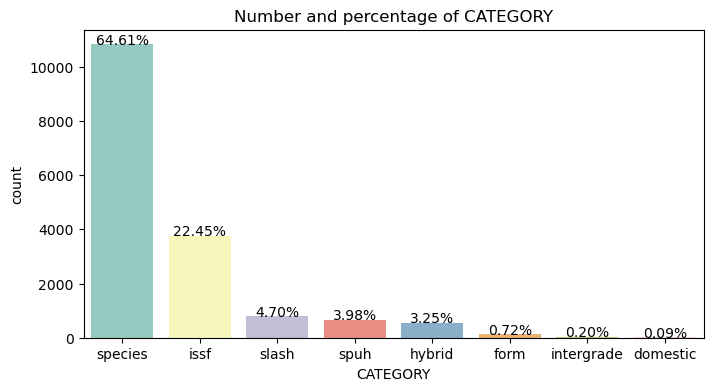

In [14]:
plot_count("CATEGORY", "CATEGORY", ebird_taxonomy_df, size=2)

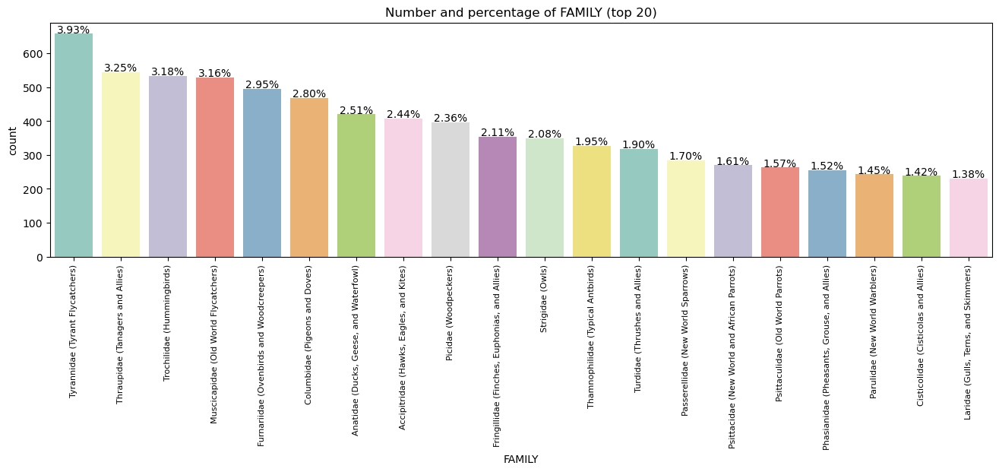

In [15]:
plot_count("FAMILY", "FAMILY (top 20)", ebird_taxonomy_df, size=4)

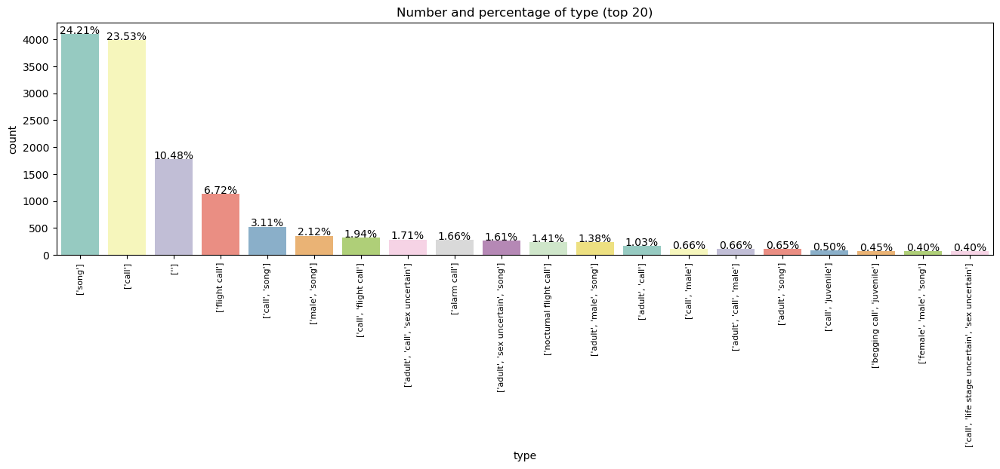

In [16]:
plot_count("type", "type (top 20)", train_metadata_df, size=4)

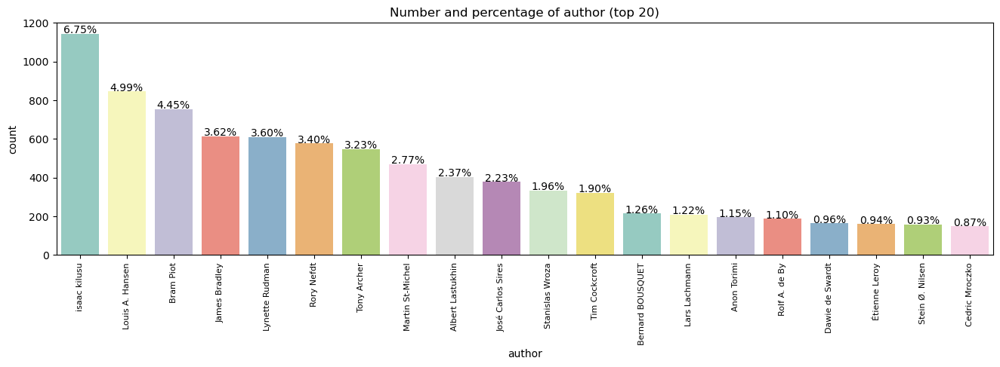

In [17]:
plot_count("author", "author (top 20)", train_metadata_df, size=4)

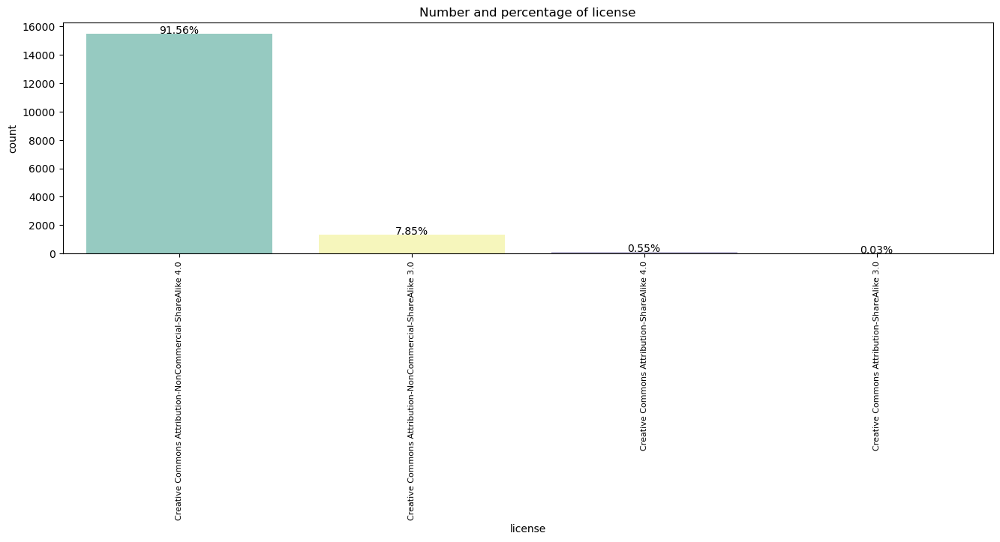

In [18]:
plot_count("license", "license", train_metadata_df, size=4)

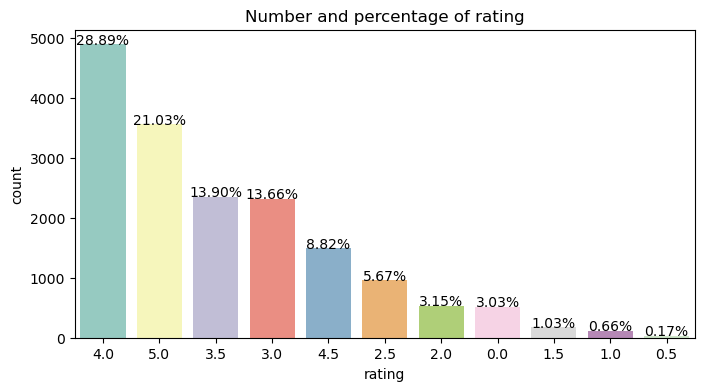

In [19]:
plot_count("rating", "rating", train_metadata_df, size=2)

## <a id='24'>Names, species words distribution</a>


For primary common name, scientific name, family, order, we present the data distribution using wordcloud.

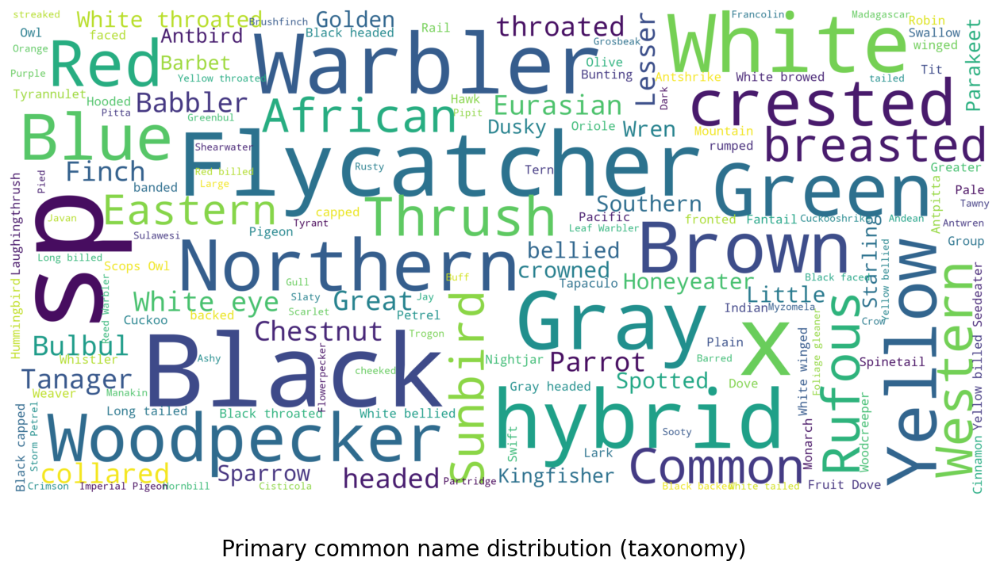

In [20]:
show_wordcloud(ebird_taxonomy_df["PRIMARY_COM_NAME"], title="Primary common name distribution (taxonomy)")

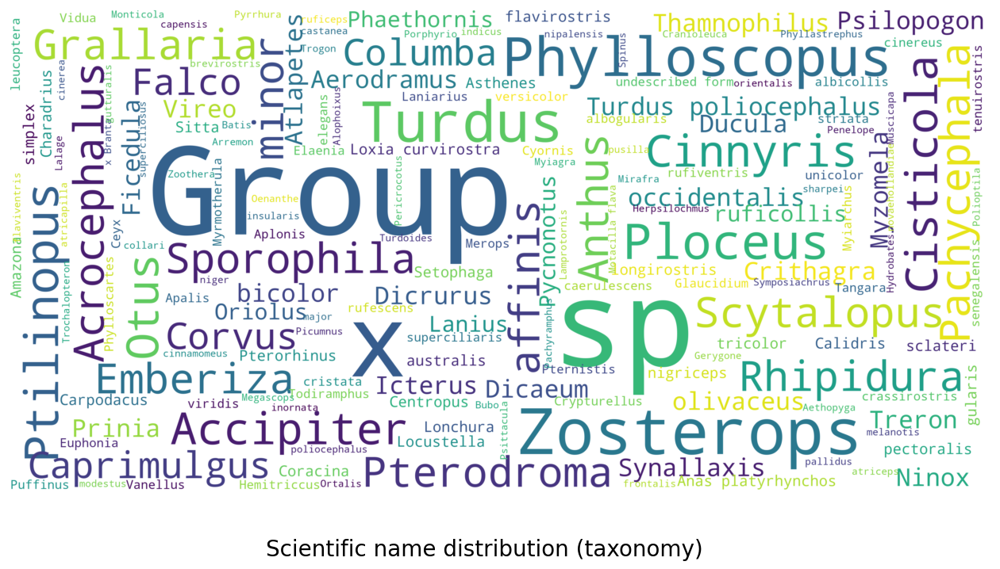

In [21]:
show_wordcloud(ebird_taxonomy_df["SCI_NAME"], title="Scientific name distribution (taxonomy)")

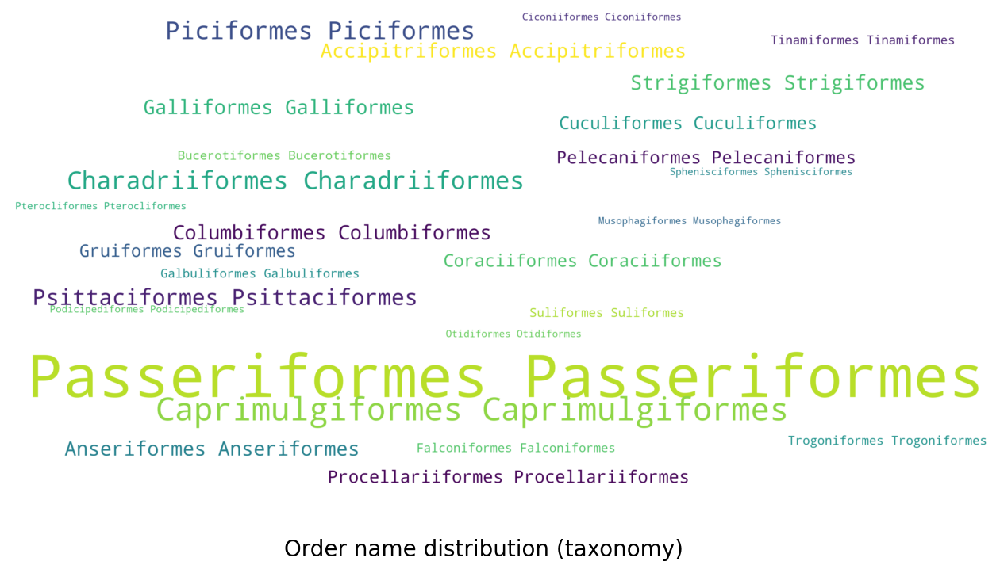

In [22]:
show_wordcloud(ebird_taxonomy_df["ORDER1"], title="Order name distribution (taxonomy)")

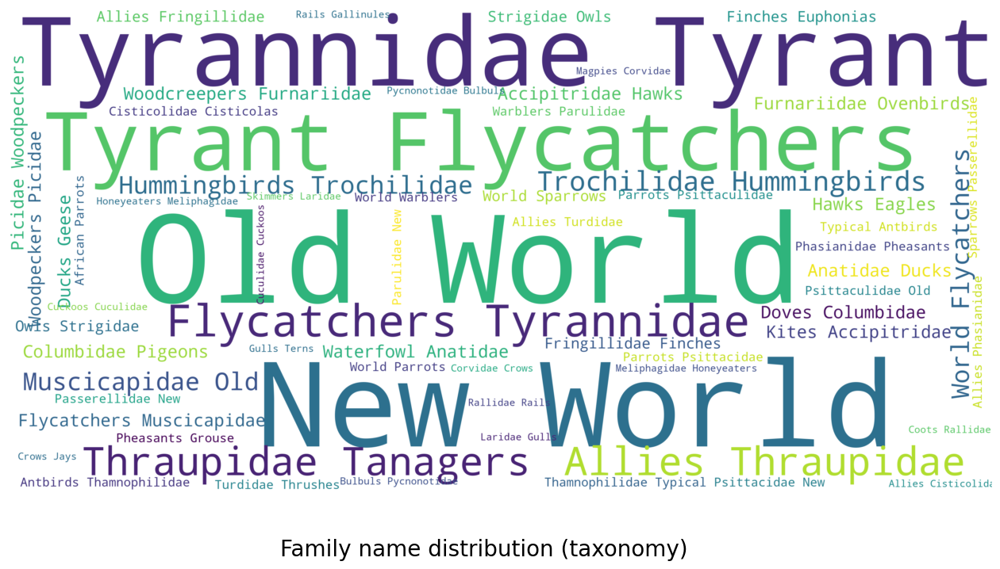

In [23]:
show_wordcloud(ebird_taxonomy_df["FAMILY"], title="Family name distribution (taxonomy)")

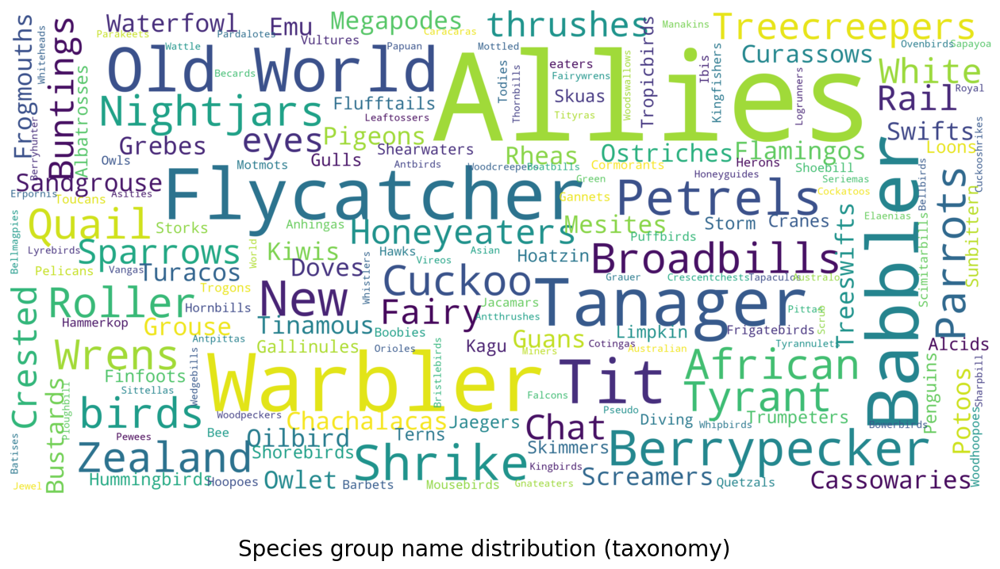

In [24]:
show_wordcloud(ebird_taxonomy_df['SPECIES_GROUP'], title="Species group name distribution (taxonomy)")

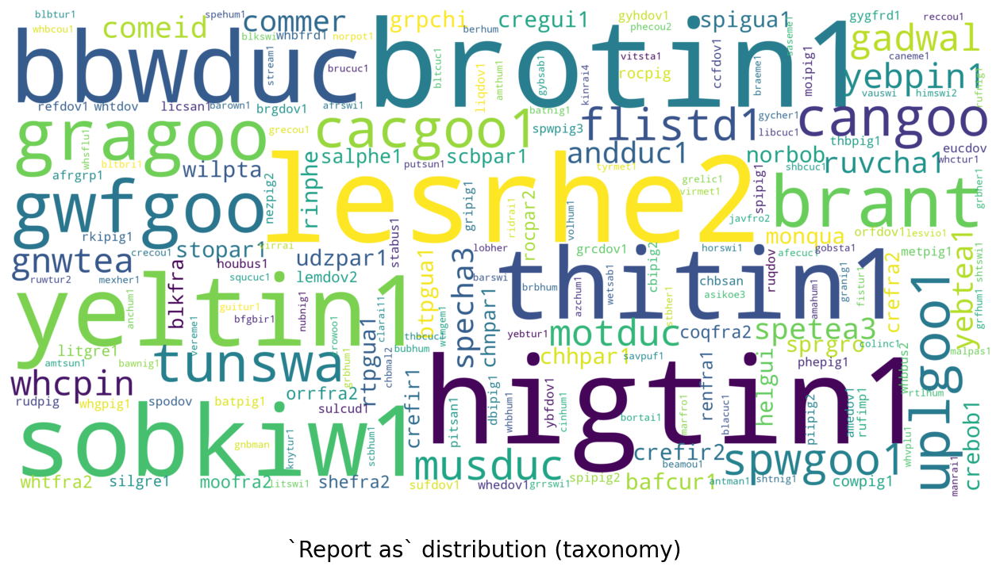

In [25]:
show_wordcloud(ebird_taxonomy_df['REPORT_AS'].drop_duplicates(), title="`Report as` distribution (taxonomy)")

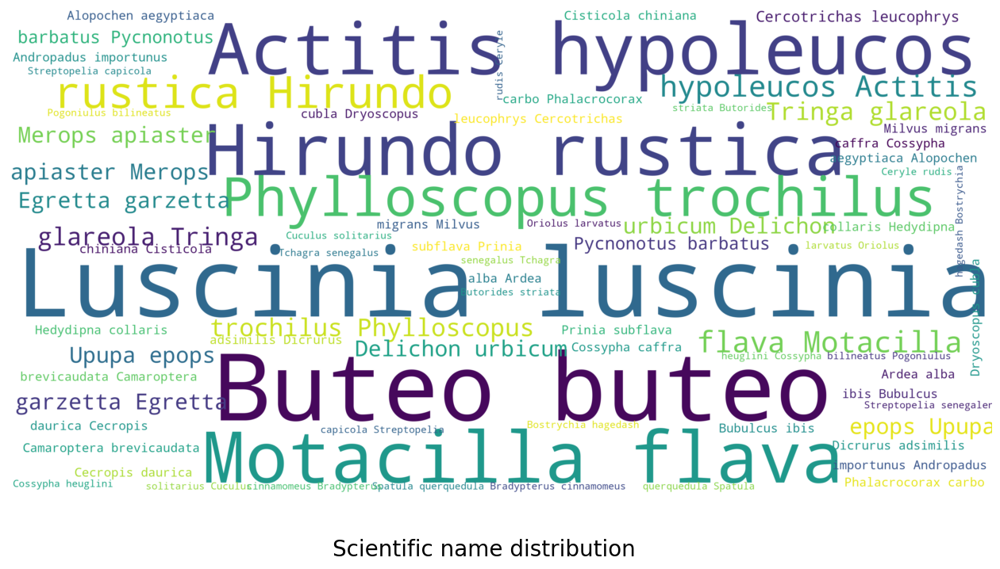

In [26]:
show_wordcloud(train_metadata_df["scientific_name"], title="Scientific name distribution")

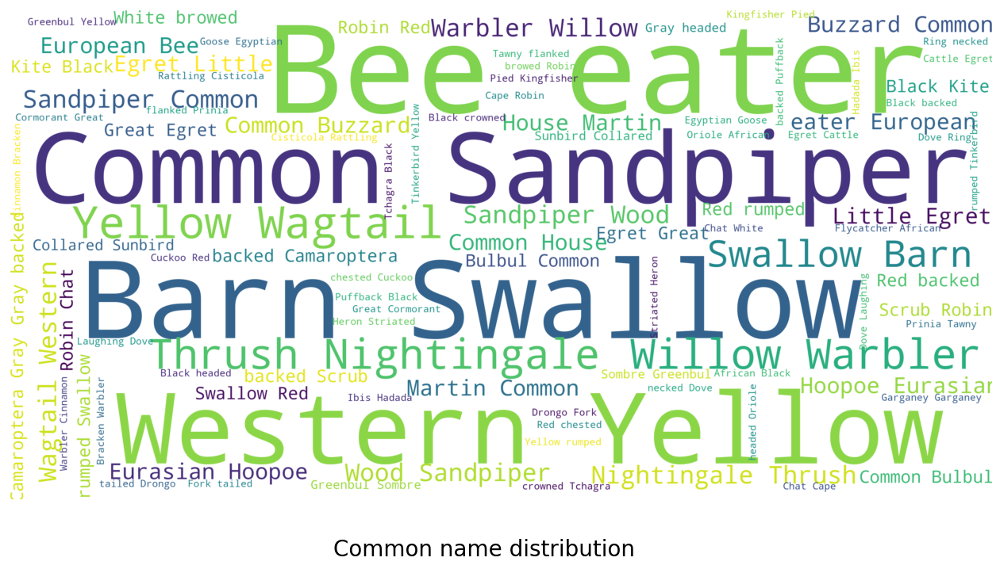

In [27]:
show_wordcloud(train_metadata_df["common_name"], title="Common name distribution")

# <a id='3'>Sample sounds analysis</a>

## <a id='31'>Sound utility functions</a> 


We import the utility scripts for audio data:
- play_sound  
- display_sound_wave  
- display_spectrogram  

In [28]:
from audio_plot_utils import play_sound, display_sound_wave, display_spectrogram

## <a id='32'>Test the sound utility functions</a>

In [29]:
test_path = "/kaggle/input/birdclef-2023/test_soundscapes/soundscape_29201.ogg"
play_sound(test_path)

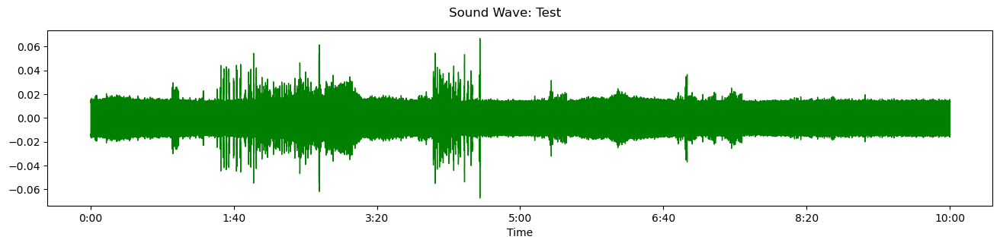

In [30]:
display_sound_wave(test_path)

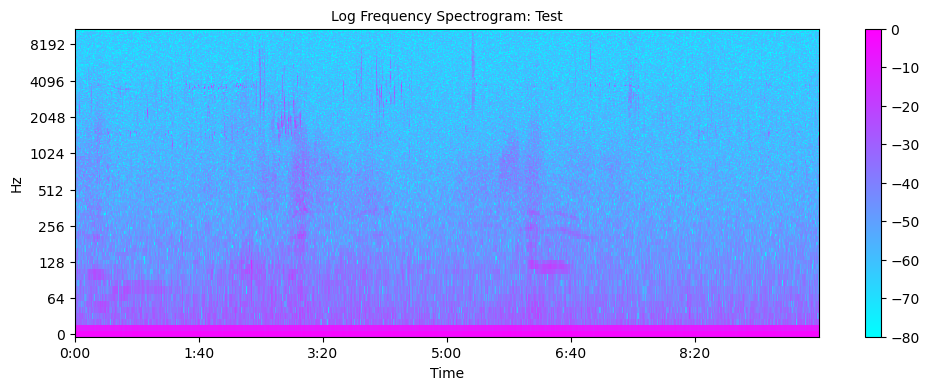

In [31]:
display_spectrogram(test_path)

## <a id='33'>Check few sounds</a>

We prepare one more utility function. This one, being specific to this Notebook/dataset, we are not extracting in a separate utility scripts.

In [32]:
def sound_utility_sample_per_primary_label(primary_label="abethr1", color="red"):
    sample_df = train_metadata_df.loc[train_metadata_df.primary_label==primary_label]
    sample_file = sample_df.sample(1)["filename"].values[0]
    base_path = "/kaggle/input/birdclef-2023/train_audio"
    full_path = os.path.join(base_path, sample_file)
    text = f"{primary_label} (sample)"
    play_sound(full_path, text=text, color=color)
    display_sound_wave(full_path, text=text, color=color)
    display_spectrogram(full_path, text=text)

### Test

Let's test this utility function.

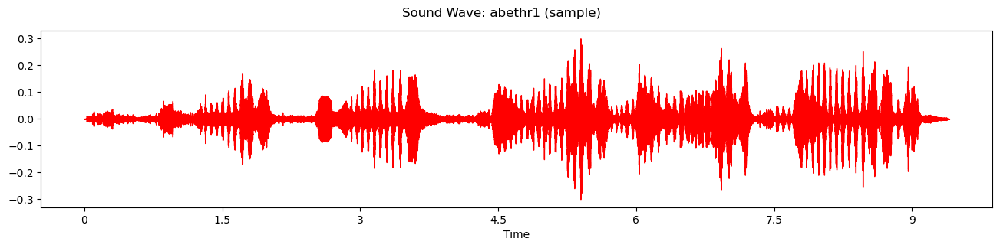

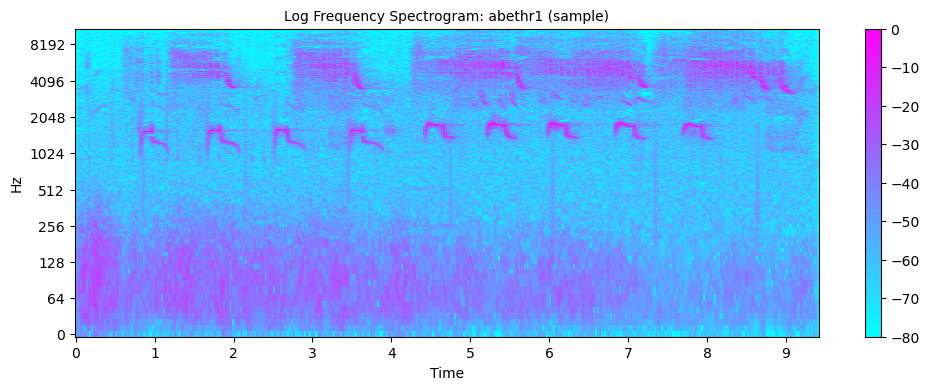

In [33]:
sound_utility_sample_per_primary_label()

### Few bird songs samples from the train set

Here we present few bird songs samples from the train set.
We pass as parameter the `primary_label` and we sample one case from the set and then call the functions to play the sound, present the spectrogram and the Mel spectrogram.

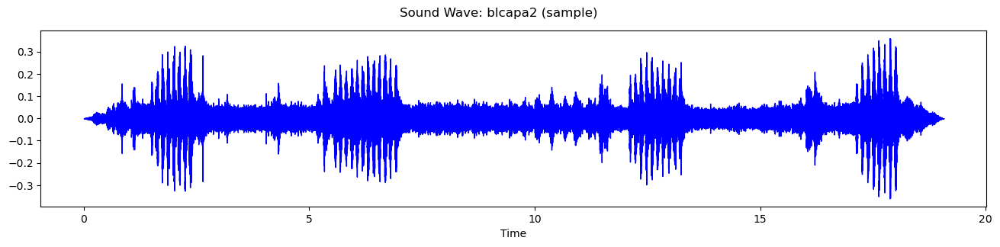

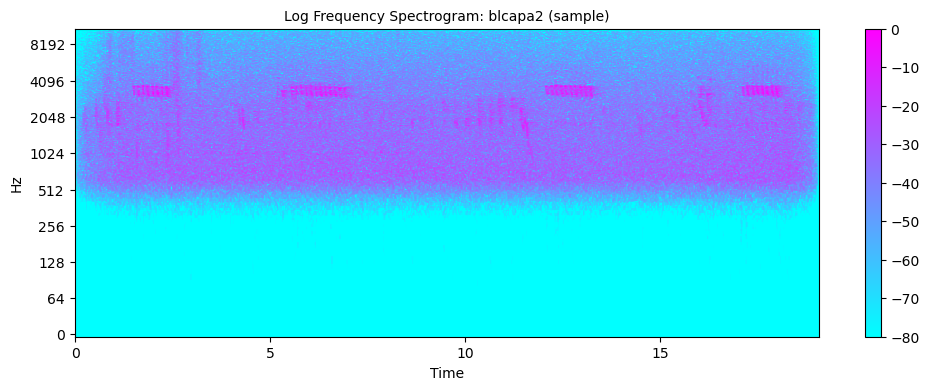

In [34]:
sound_utility_sample_per_primary_label('blcapa2', color='blue')

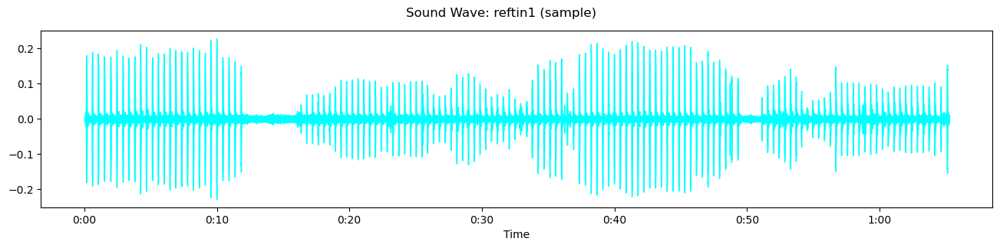

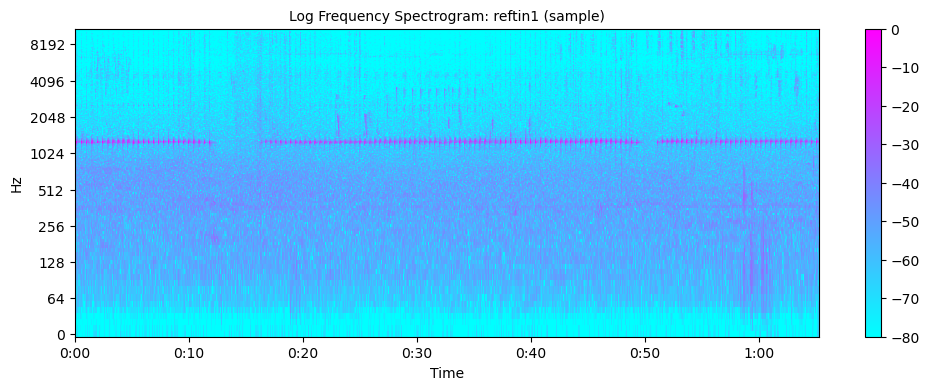

In [35]:
sound_utility_sample_per_primary_label('reftin1', color='cyan')

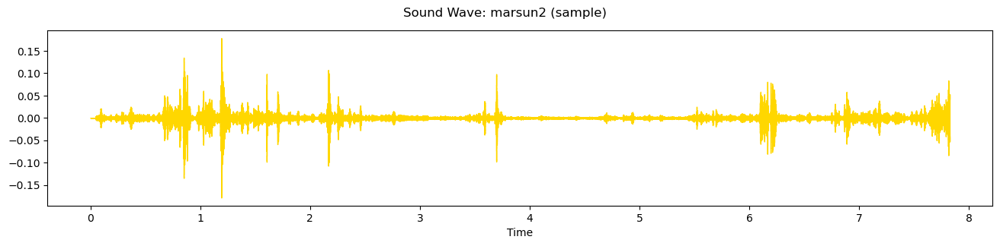

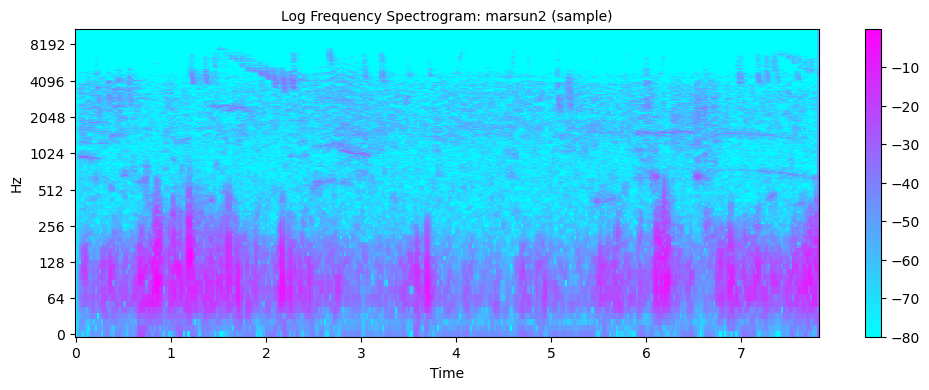

In [36]:
sound_utility_sample_per_primary_label('marsun2', color='gold')

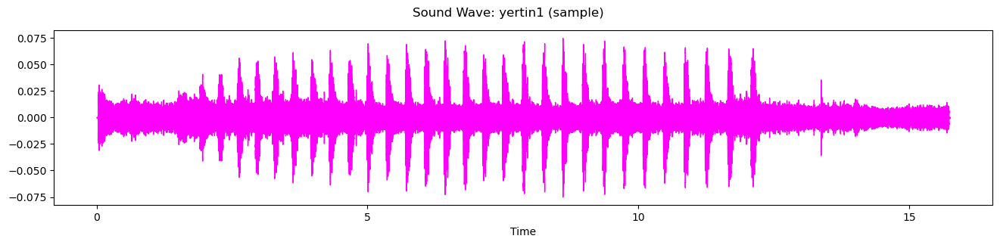

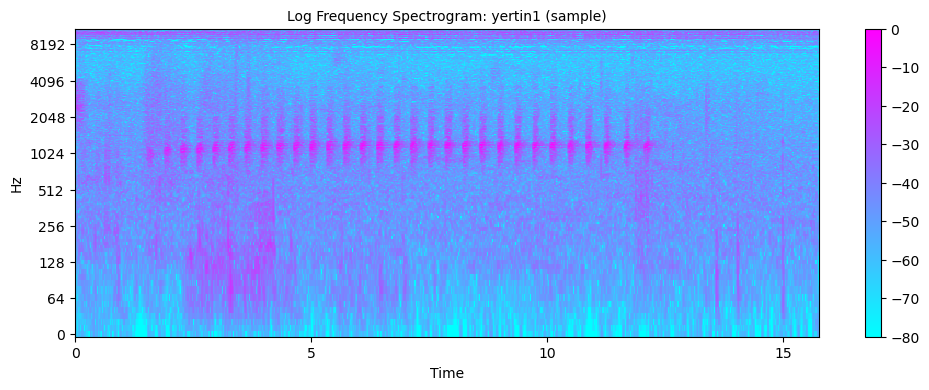

In [37]:
sound_utility_sample_per_primary_label('yertin1', color='magenta')

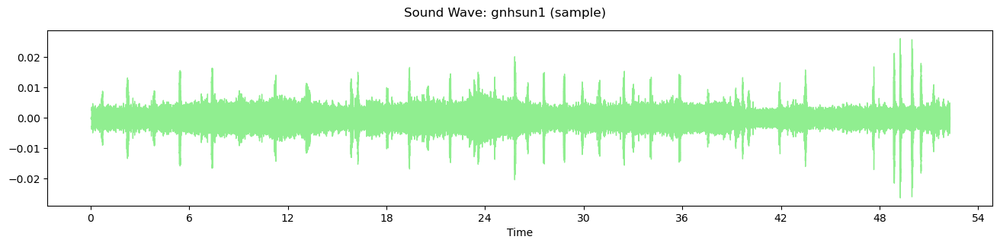

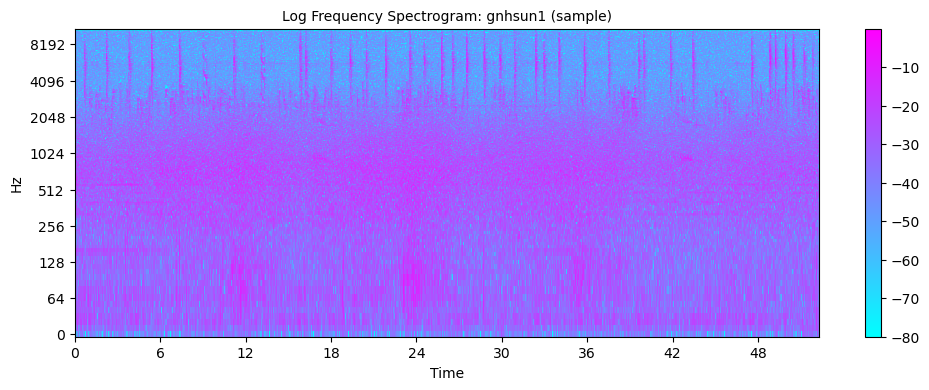

In [38]:
sound_utility_sample_per_primary_label('gnhsun1', color='lightgreen')

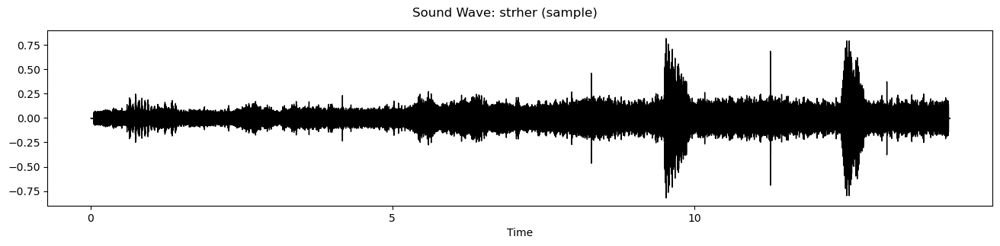

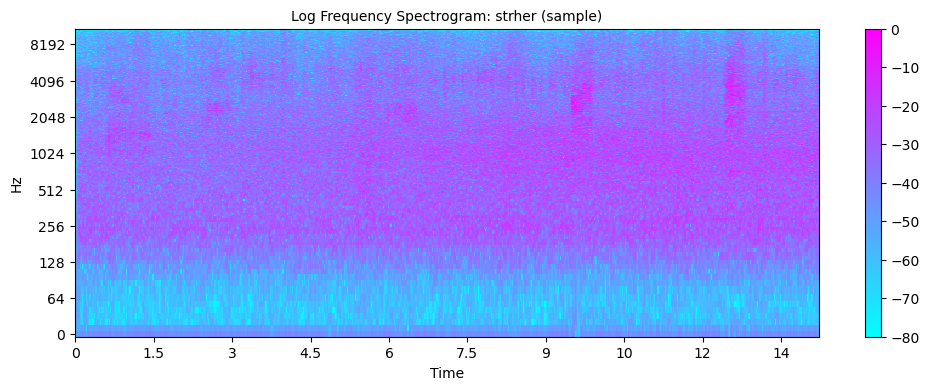

In [39]:
sound_utility_sample_per_primary_label('strher', color='black')

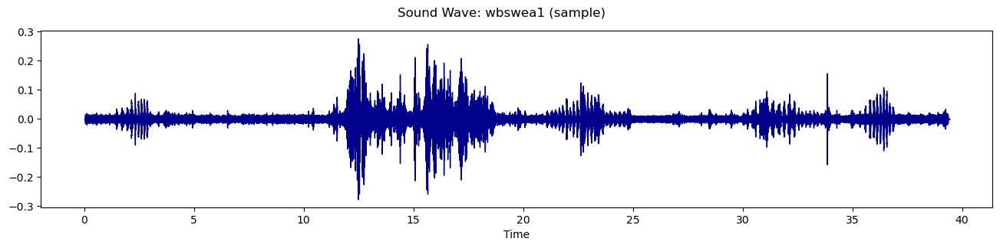

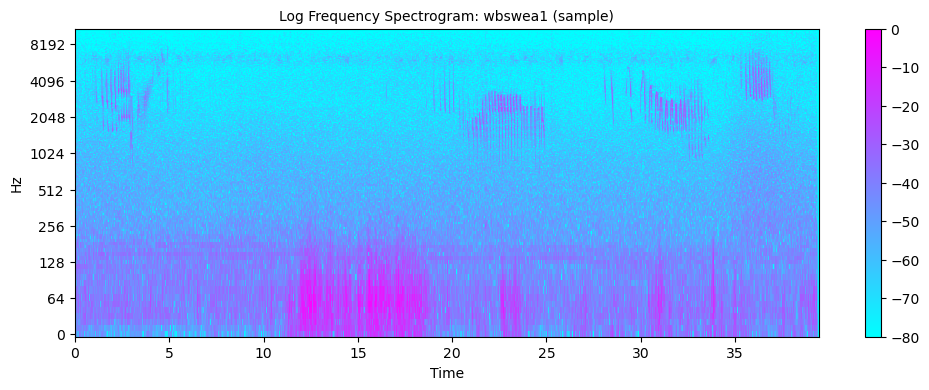

In [40]:
sound_utility_sample_per_primary_label('wbswea1', color='darkblue')